In [14]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams['figure.max_open_warning'] = 0
import numpy as np
#import pandas as pd
df3 = pd.read_table(r"D:\Yuliya_test_data_table\Yuliya_test_data_table_deconv-only_3prime.txt", delimiter = '\t')#, nrows=2)
df5 = pd.read_table(r"D:\Yuliya_test_data_table\Yuliya_test_data_table_deconv-only.txt", delimiter = '\t')#, nrows=2)


In [15]:
dfclean5 = df5.copy()
#keep this order because I went through the output file individually to determine these lines
dfclean5 = dfclean5[~dfclean5.index.isin(range(33482, 33797))] #122
dfclean5 = dfclean5[~dfclean5.index.isin(range(34747, 35652))] #126, 127, 128
dfclean5 = dfclean5[~dfclean5.index.isin(range(35930, 36501))] #130, 131
dfclean5 = dfclean5[~dfclean5.index.isin(range(36770, 37054))] #133
dfclean5 = dfclean5[~dfclean5.index.isin(range(38773, 39015))] #140
dfclean5 = dfclean5[~dfclean5.index.isin(range(39325, 39543))] #142
dfclean5 = dfclean5[~dfclean5.index.isin(range(40030, 40626))] #145, 146
dfclean5 = dfclean5[~dfclean5.index.isin(range(46853, 49718))] #170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182
dfclean5 = dfclean5[~(dfclean5.index >= 115849)] #the rest

pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.width', None)  # Disable column width wrapping

# Print the entire dataframe
#print(dfclean5)
#dfclean2.to_excel('C:/Users/Administrator/Desktop/dfclean5.xlsx', index=False)

In [16]:
dfclean5_adjustedto_m = dfclean5
numeric_columns = dfclean5_adjustedto_m.select_dtypes(include=[np.number]).columns

# Calculate z-scores and adjust outliers to the mean
numeric_columns = dfclean5_adjustedto_m.select_dtypes(include=[np.number]).columns

# Adjust outliers to the mean
for col in numeric_columns:
    mean = dfclean5_adjustedto_m[col].mean()
    std = dfclean5_adjustedto_m[col].std()
    z_scores = (dfclean5_adjustedto_m[col] - mean) / std
    
    # Replace outliers (threshold: 3 standard deviations from the mean) with the mean
    outlier_threshold = 20.0
    dfclean5_adjustedto_m[col] = np.where(np.abs(z_scores) > outlier_threshold, mean, dfclean5_adjustedto_m[col])
    dfclean5_adjustedto_m[col] =  dfclean5_adjustedto_m[col].astype(int)
#print(dfclean3_adjustedto_m)

In [17]:
C15_df = dfclean5_adjustedto_m[['IB', 'plate', 'well', 'C15', 'C25']]
D15_df = dfclean5_adjustedto_m[['IB', 'plate', 'well', 'D15','D25']]
R15_df = dfclean5_adjustedto_m[['IB', 'plate', 'well', 'R15', 'R25']]
print( C15_df.columns)


Index(['IB', 'plate', 'well', 'C15', 'C25'], dtype='object')


In [18]:
C15_df['platenum'] = C15_df['plate'].str.extract(r'(\d+)').astype(int)
C15_df['difference'] = C15_df['C15']-C15_df['C25']

D15_df['platenum'] = D15_df['plate'].str.extract(r'(\d+)').astype(int)
C15_df['difference'] = C15_df['C15']-C15_df['C25']

R15_df['platenum'] = R15_df['plate'].str.extract(r'(\d+)').astype(int)
R15_df['differenceR'] = R15_df['R15']-R15_df['R25']

#print( C15_df.columns)

C:\Users\Administrator\AppData\Local\Temp\ipykernel_15252\1326148125.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  C15_df['platenum'] = C15_df['plate'].str.extract(r'(\d+)').astype(int)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_15252\1326148125.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  C15_df['difference'] = C15_df['C15']-C15_df['C25']
C:\Users\Administrator\AppData\Local\Temp\ipykernel_15252\1326148125.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice

In [1]:

C15_dfgroups = {}
#C25_dfgroups = {}
D15_dfgroups = {}
#D25_dfgroups = {}
R15_dfgroups = {}
#R25_dfgroups = {}

for pattern, group in C15_df.groupby('platenum'):
    C15_dfgroups[pattern] = group
    print( group.columns)
for pattern, group in C25_dfgrouped.groupby('platenum'):
    C25_dfgroups[pattern] = group
    
for pattern, group in D15_df.groupby('platenum'):
    D15_dfgroups[pattern] = group
    
for pattern, group in D25_dfgrouped.groupby('platenum'):
    D25_dfgroups[pattern] = group
    
for pattern, group in R15_df.groupby('platenum'):
    R15_dfgroups[pattern] = group
    
for pattern, group in R25_dfgrouped.groupby('platenum'):
    R25_dfgroups[pattern] = group


NameError: name 'C15_df' is not defined

In [2]:
for key, df in C15_dfgroups.items():
    plt.figure(figsize=(25, 6))
    plt.scatter(df.index, df['C15'].astype(int), label='C15')  # Convert to int and plot 'C15' column
    plt.scatter(df.index, df['C25'].astype(int), label='C25')  # Convert to int and plot 'C25' column
    plt.scatter(df.index, df['difference'].astype(int), label='difference')  # Convert to int and plot 'C25' column

    
    plt.xlabel('Index')  # Assuming 'well' is not a numeric column, otherwise, replace with 'well'
    plt.ylabel('Data')
    plt.title(f'Plot for plate {key}')
    plt.legend()
    plt.show()

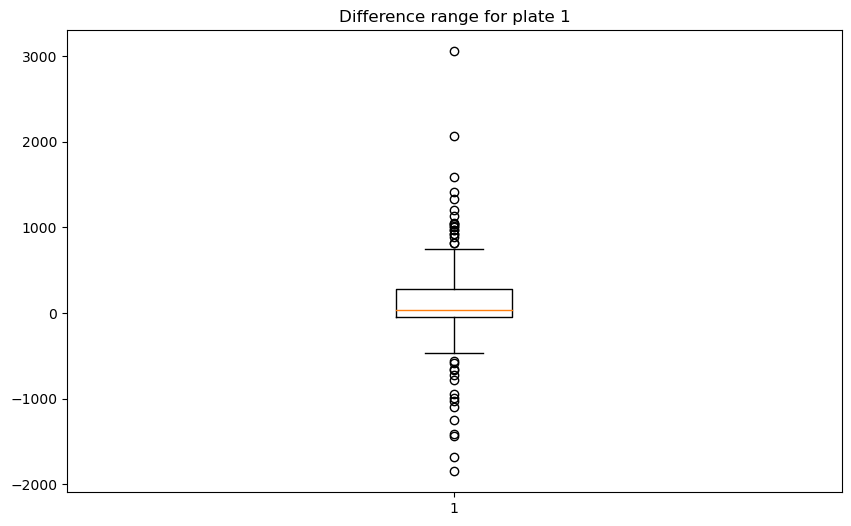

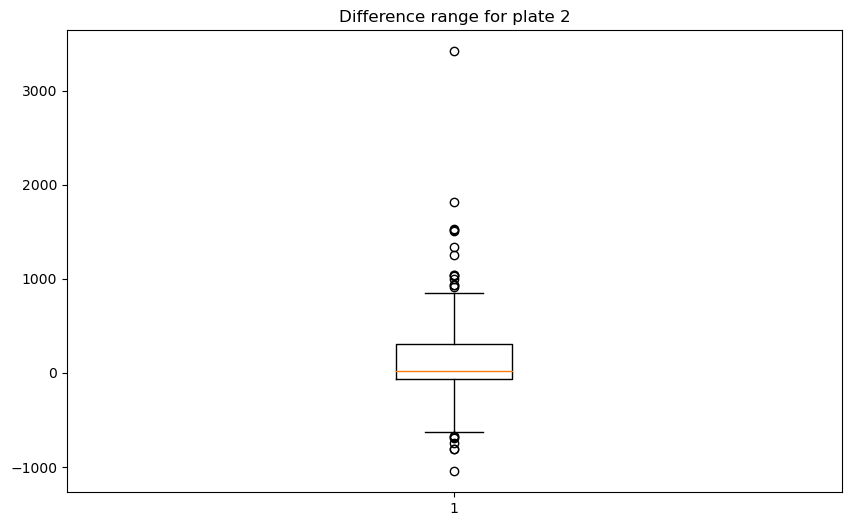

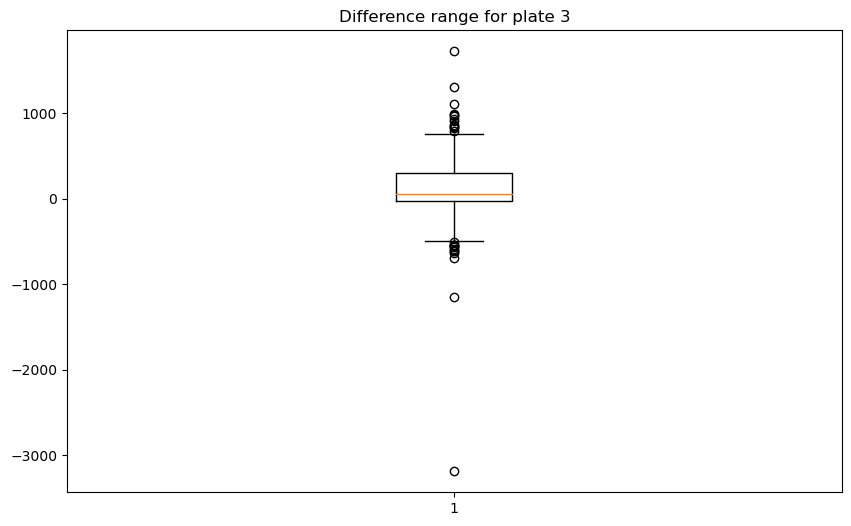

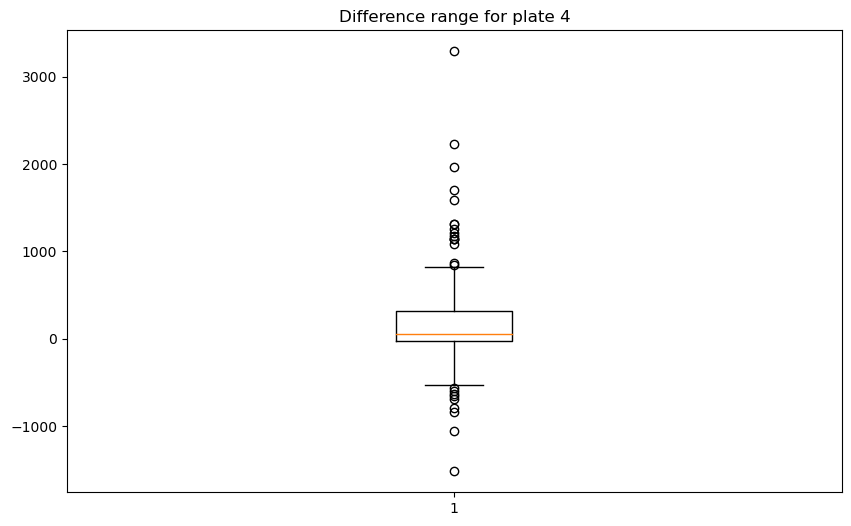

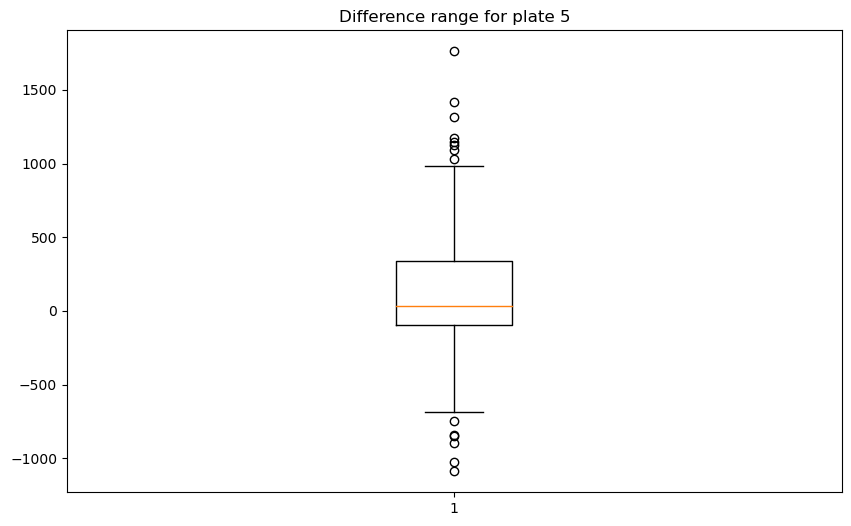

...

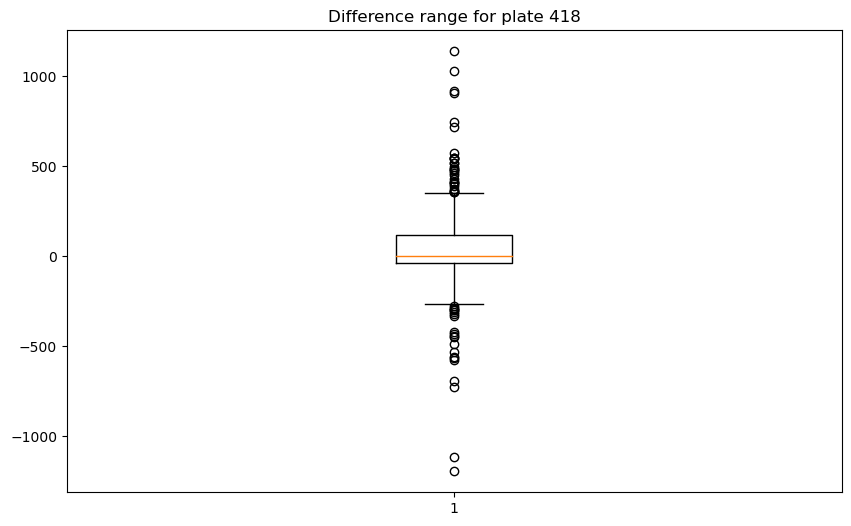

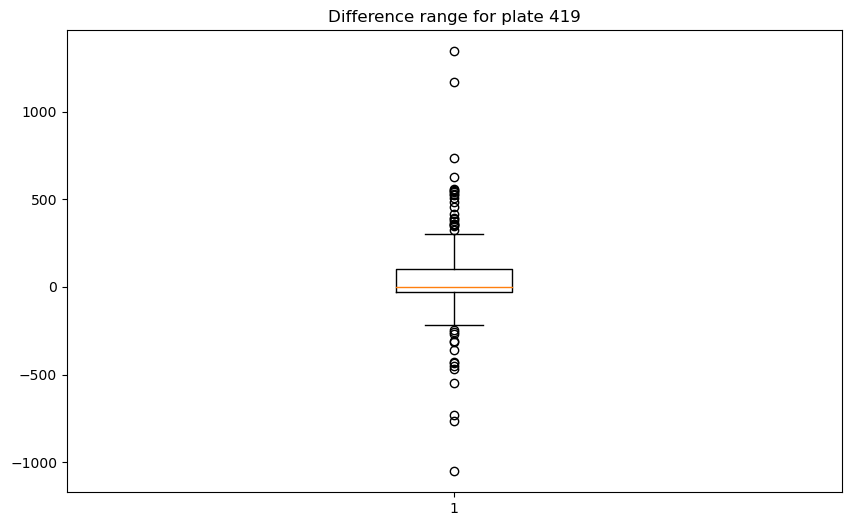

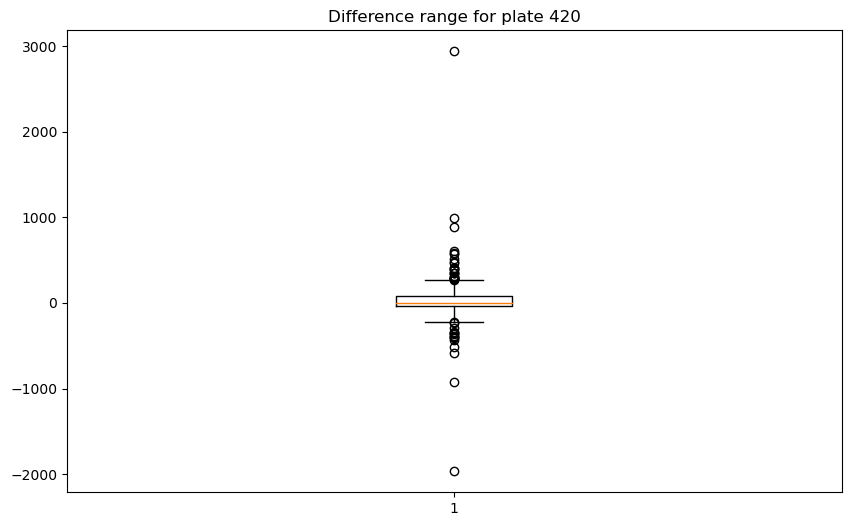

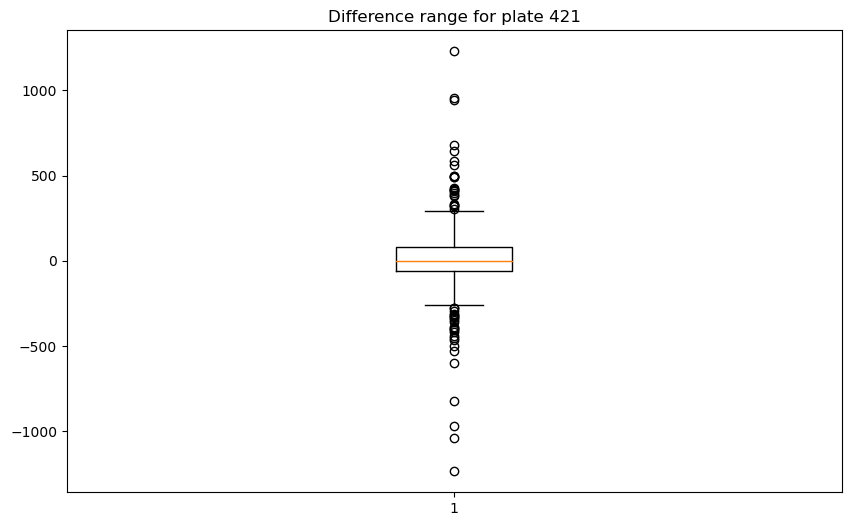

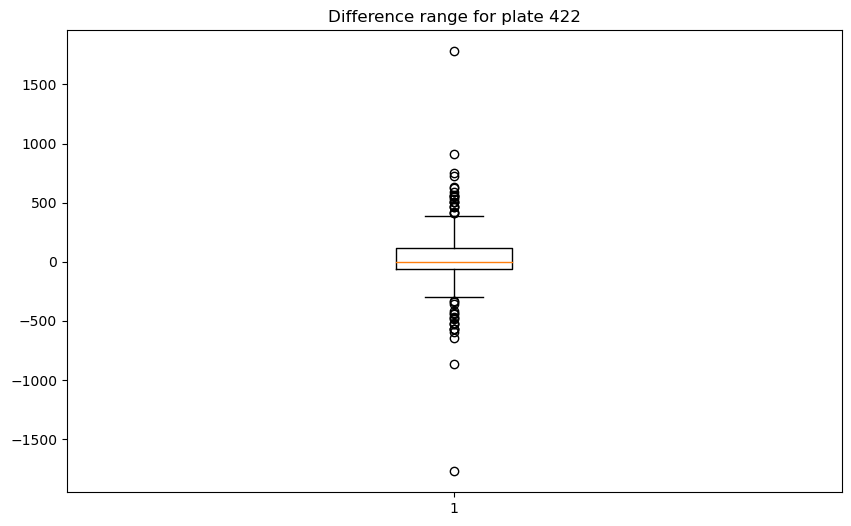

In [21]:
for key, df in C15_dfgroups.items():
    plt.figure(figsize=(10, 6))
    plt.boxplot([df['difference']])
    plt.title(f'Difference range for plate {key}')

plt.show()

In [22]:
for key, df in R15_dfgroups.items():
    plt.figure(figsize=(25, 6))
    plt.scatter(df.index, df['R15'].astype(int), label='R15')  # Convert to int and plot 'C15' column
    plt.scatter(df.index, df['R25'].astype(int), label='R25')  # Convert to int and plot 'C25' column
    plt.scatter(df.index, df['differenceR'].astype(int), label='differenceR')  # Convert to int and plot 'C25' column

    
    plt.xlabel('Index')  # Assuming 'well' is not a numeric column, otherwise, replace with 'well'
    plt.ylabel('Data')
    plt.title(f'Plot for plate {key}')
    plt.legend()
    plt.show()


In [23]:
for key, df in R15_dfgroups.items():
    plt.figure(figsize=(10, 6))
    plt.boxplot([df['differenceR']])
    plt.title(f'Difference range for plate {key}')

plt.show()